In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.animation import PillowWriter
from IPython.display import Image

In [21]:
# sns.set_style("white")
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['axes.titlesize'] = 19
plt.rcParams['axes.labelpad'] = 15
plt.rcParams['xtick.labelsize'] = 19
plt.rcParams['ytick.labelsize'] = 19
plt.rcParams['legend.fontsize'] = 25
plt.rcParams['figure.titlesize'] = 19
plt.rcParams['figure.figsize'] = (8,8)
plt.rcParams['lines.linewidth'] = 3
plt.rcParams['errorbar.capsize'] = 3.0

In [22]:
# Define the landscape function
def energy_landscape(x):
    return np.sin(2 * np.pi * x) + 0.5 * np.sin(4 * np.pi * x) + 0.2 * np.sin(8 * np.pi * x)

In [23]:

# Create the figure
fig, ax = plt.subplots(figsize=(8,4))
x = np.linspace(-0.1, 1, 500)
y = energy_landscape(x)

ax.plot(x, y, color='black', lw=1)
particle, = ax.plot([], [], 'ro', markersize=8)

# Set plot limits and labels
ax.set_xlim(-0.1, 1)
ax.set_ylim(y.min() - 0.5, y.max() + 0.5)
ax.set_xlabel('Conformational Coordinate')
ax.set_ylabel('Energy')

# Initialization function
def init():
    particle.set_data([], [])
    return particle,

# Animation function
def animate(i):
    if i < 50:
        # Particle vibrates around the starting point
        xi = 0.01 * np.sin(i * 0.25)
    else:
        # Particle traverses the landscape
        progress = (i - 50) / 150
        xi = progress
    yi = energy_landscape(xi)
    particle.set_data([xi], [yi])
    return particle,

# Create animation
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=240, interval=50, blit=True)

# Save animation as GIF
anim.save('particle_landscape.gif', writer='pillow', fps=20, dpi=300)

# Display animation
plt.close()
from IPython.display import HTML
HTML(anim.to_jshtml())

# 2D Landscape

In [27]:
# Provided coordinates
x_values = np.array([0.49729875, 0.51584435, 0.5592979 , 0.6301594 , 0.70936763,
                     0.81909746, 0.8976211 , 0.91414624, 0.8142078 , 0.66728896,
                     0.59872246, 0.63635474, 0.7493763 , 0.83675265, 0.8539679 ,
                     0.80322826, 0.7395609 , 0.737562  , 0.7871762 , 0.84365815,
                     0.9083941 , 0.97641444, 1.0608933 , 1.0960765 , 1.061612  ,
                     1.0325872 , 1.0225511 , 1.0248344 , 1.0344514 , 1.0150476 ,
                     0.9365259 , 0.8706259 , 0.8428744 , 0.8225653 , 0.8301117 ,
                     0.8481573 , 0.87332785, 0.8848386 , 0.8451946 , 0.9029739 ,
                     1.0581213 , 1.1638106 , 1.1893811 , 1.1371125 , 1.0498717 ,
                     0.9526392 , 0.8456648 , 0.7752315 , 0.84365016, 0.96911955,
                     1.029427  , 1.0542673 , 1.0558343 , 1.0073308 , 0.96589756,
                     0.9512233 , 0.9436454 , 0.93614626, 0.9881145 , 1.028488  ,
                     0.9437872 , 0.8003311 , 0.77448815, 0.85454214, 0.95528924,
                     1.140331  , 1.3056054 , 1.3799168 , 1.3764359 , 1.3099418])

y_values = np.array([1.6630155, 1.6258007, 1.6216996, 1.6388023, 1.6439009, 1.6757425,
                     1.7254336, 1.7494639, 1.7109478, 1.6497955, 1.5673015, 1.5256068,
                     1.6312428, 1.789571 , 1.8506634, 1.8115089, 1.7435544, 1.759711 ,
                     1.8985324, 1.9928918, 1.9358691, 1.8158628, 1.7527357, 1.7424507,
                     1.7113258, 1.6759053, 1.6633484, 1.6617534, 1.6930425, 1.7483983,
                     1.7562188, 1.6889565, 1.6241804, 1.634988 , 1.6884071, 1.6790851,
                     1.6529316, 1.6474065, 1.6206172, 1.5923392, 1.604075 , 1.6605659,
                     1.7211657, 1.7784665, 1.7932438, 1.7518415, 1.7309917, 1.7315255,
                     1.7032255, 1.639651 , 1.5834908, 1.5691597, 1.5370754, 1.4688122,
                     1.4631735, 1.4808743, 1.4737085, 1.4552295, 1.4302917, 1.3785664,
                     1.3121897, 1.2887282, 1.212135 , 1.1151062, 1.0645533, 1.0466026,
                     1.0614233, 0.98146  , 0.8292845, 0.7602132])

In [28]:
# Interpolate for smooth path
num_frames = 150
t = np.linspace(0.1, 1, num_frames)
interp_x = interp1d(np.linspace(0, 1, len(x_values)), x_values, kind='cubic')
interp_y = interp1d(np.linspace(0, 1, len(y_values)), y_values, kind='cubic')
x_path = interp_x(t)
y_path = interp_y(t)


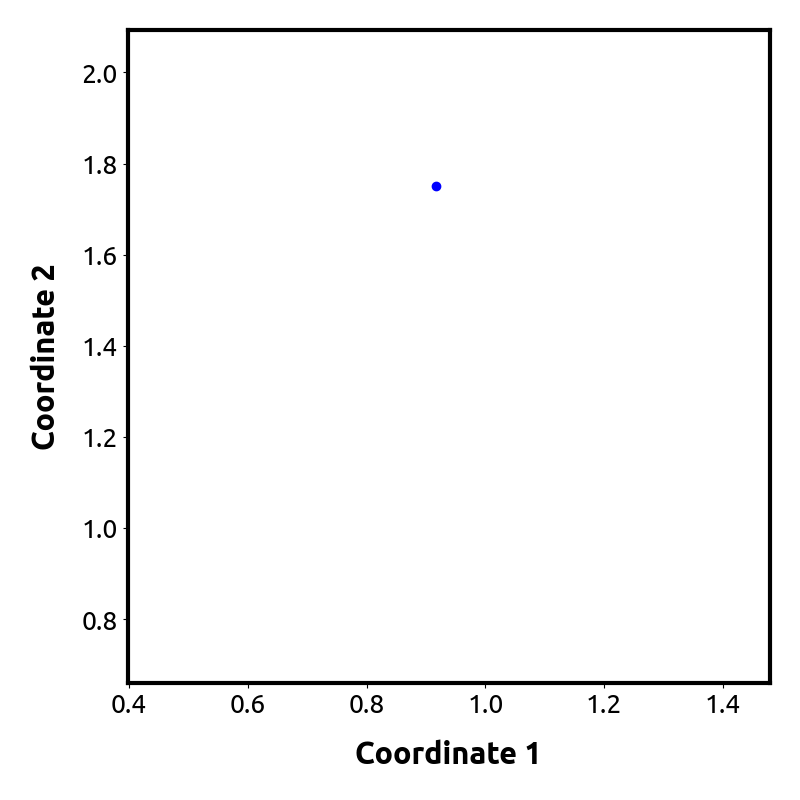

In [34]:
# Setup figure
fig, ax = plt.subplots(figsize=(8, 8))
# ax.plot(x_values, y_values, 'k--', lw=0.5)
line, = ax.plot([], [], 'r-', lw=2)
particle, = ax.plot([], [], 'bo', markersize=6)
ax.set_xlim(x_values.min() - 0.1, x_values.max() + 0.1)
ax.set_ylim(y_values.min() - 0.1, y_values.max() + 0.1)
ax.set_xlabel('Coordinate 1')
ax.set_ylabel('Coordinate 2')

# Manual GIF saving using PillowWriter
def save_gif(path, fps=20, dpi=100):
    writer = PillowWriter(fps=fps)
    with writer.saving(fig, path, dpi=dpi):
        for i in range(num_frames):
            # update data
            line.set_data(x_path[:i+1], y_path[:i+1])
            particle.set_data([x_path[i]], [y_path[i]])
            fig.canvas.draw()
            writer.grab_frame()

plt.tight_layout()

# Call saving function and display result
save_gif('particle_2d_path.gif')
plt.close(fig)
Image(filename='particle_2d_path.gif')

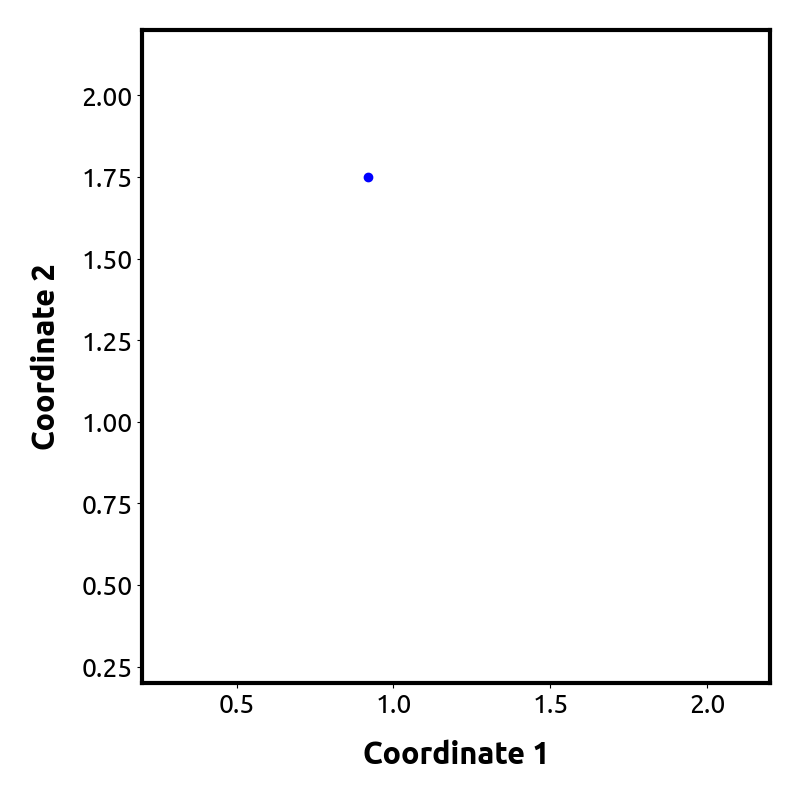

In [35]:
# Setup figure
fig, ax = plt.subplots(figsize=(8, 8))
# ax.plot(x_values, y_values, 'k--', lw=0.5)
line, = ax.plot([], [], 'r-', lw=2)
particle, = ax.plot([], [], 'bo', markersize=6)
# ax.set_xlim(x_values.min() - 0.1, x_values.max() + 0.1)
# ax.set_ylim(y_values.min() - 0.1, y_values.max() + 0.1)
ax.set_xlim(0.2, 2.2)
ax.set_ylim(0.2, 2.2)
ax.set_xlabel('Coordinate 1')
ax.set_ylabel('Coordinate 2')

# Manual GIF saving using PillowWriter
def save_gif(path, fps=20, dpi=100):
    writer = PillowWriter(fps=fps)
    with writer.saving(fig, path, dpi=dpi):
        for i in range(num_frames):
            # update data
            line.set_data(x_path[:i+1], y_path[:i+1])
            particle.set_data([x_path[i]], [y_path[i]])
            fig.canvas.draw()
            writer.grab_frame()

plt.tight_layout()

# Call saving function and display result
save_gif('particle_2d_path_consistent-axes.gif')
plt.close(fig)
Image(filename='particle_2d_path_consistent-axes.gif')